<h1><center>BCSE417P Lab Assignment - 1</center></h1>
<h1><center>Tanish Sarang Mahajan 21BAI1187</center></h1>
<h1><center>August 17, 2024</center></h1>
<h1><center>By turning in this assignemnent, I agree and declare that all of this is my own work</center></h1>

# AS-1

## Task 1: Basic Image Statistic and Color Space Conversion

Blue Channel:
  Mean: 110.46
  Standard Deviation: 58.78


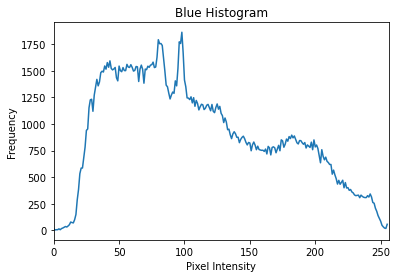

Green Channel:
  Mean: 89.41
  Standard Deviation: 61.52


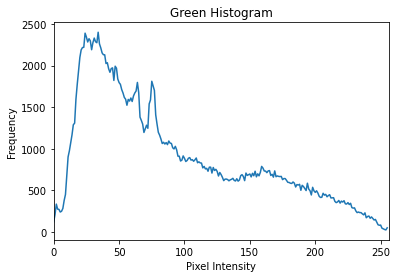

Red Channel:
  Mean: 126.82
  Standard Deviation: 86.46


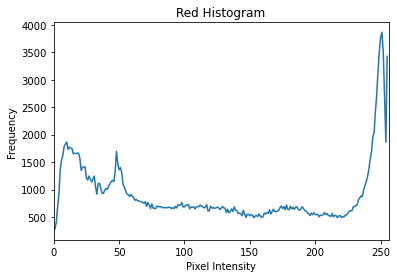

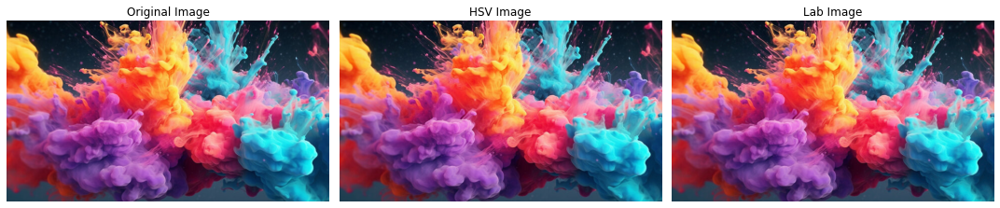

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def compute_basic_statistics(image):
    """
    Compute basic statistics (mean, standard deviation, histogram) for each color channel.
    """
    channels = cv2.split(image)
    stats = {}
    
    for i, color in enumerate(['Blue', 'Green', 'Red']):
        channel = channels[i]
        mean = np.mean(channel)
        stddev = np.std(channel)
        histogram = cv2.calcHist([channel], [0], None, [256], [0, 256])
        
        stats[color] = {
            'Mean': mean,
            'Standard Deviation': stddev,
            'Histogram': histogram
        }
    
    return stats

def convert_color_spaces(image):
    """
    Convert the image to HSV and Lab color spaces.
    """
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)
    
    return hsv_image, lab_image

def display_images(original, hsv_image, lab_image):
    """
    Display the original image and its HSV and Lab color space conversions.
    """
    plt.figure(figsize=(15, 10))
    
    plt.subplot(1, 3, 1)
    plt.title('Original Image')
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.title('HSV Image')
    plt.imshow(cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB))
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.title('Lab Image')
    plt.imshow(cv2.cvtColor(lab_image, cv2.COLOR_Lab2RGB))
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

image_path = 'colors.jpg'  
image = cv2.imread(image_path)

if image is None:
    raise FileNotFoundError(f"The image at {image_path} could not be found.")

stats = compute_basic_statistics(image)
for color, values in stats.items():
    print(f"{color} Channel:")
    print(f"  Mean: {values['Mean']:.2f}")
    print(f"  Standard Deviation: {values['Standard Deviation']:.2f}")
    plt.figure(figsize=(6, 4))
    plt.title(f"{color} Histogram")
    plt.plot(values['Histogram'])
    plt.xlim([0, 256])
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.show()

hsv_image, lab_image = convert_color_spaces(image)

display_images(image, hsv_image, lab_image)


Observation:

BGR Statistics:

- The mean values across the BGR channels can reveal the overall color balance of the image. For instance, a higher mean in the blue channel could suggest a cooler image tone.
- The standard deviation provides insight into the contrast within each channel, where a higher standard deviation indicates more color variation.
- The histograms for each channel can show whether the image is balanced or skewed toward certain colors, and how much of the image is composed of darker or lighter tones.

HSV Color Space:

- The Hue component simplifies the identification of colors, making it easier to distinguish between different objects based on color alone.
- The Saturation component can help identify how vivid or muted the colors in the image are, which is useful for image enhancement or color grading.
- The Value component can highlight differences in lighting or shadows within the image.

Lab Color Space:

- The Lightness channel provides a grayscale representation of the image, showing the brightness variations without the influence of color.
- The a* and b* channels can be used to analyze color variations and differences more accurately, making Lab a useful color space for tasks like color correction.

Conclusion:

- Image Analysis: By computing basic statistics (mean, standard deviation, and histograms) for each color channel, you gain a quantitative understanding of the image's color distribution, contrast, and overall brightness. This information is crucial for any image processing task, as it informs decisions on how to manipulate the image for better results.

- Color Space Conversion: Converting the image to different color spaces like HSV and Lab allows for more nuanced image analysis and processing. HSV is useful for tasks involving color-based segmentation and lighting invariance, while Lab is beneficial for tasks requiring precise color correction and human-perceived color differences. Understanding the properties of these color spaces and their components can help in selecting the right approach for various image processing tasks.

## Task 2: Simple Image Segmentation Using Thresholding

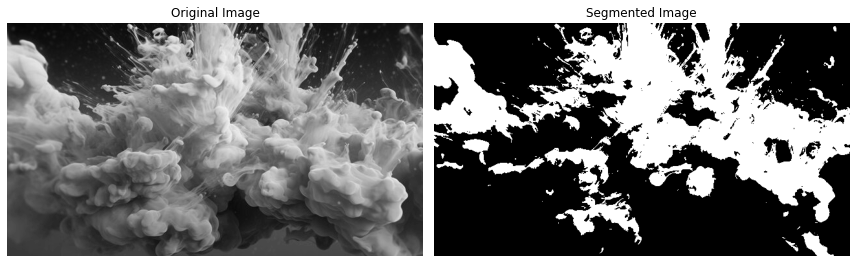

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_thresholding(image, threshold_value):
    """
    Apply global thresholding to segment the image into foreground and background.
    """
    _, segmented_image = cv2.threshold(image, threshold_value, 255, cv2.THRESH_BINARY)
    return segmented_image

def display_images(original, segmented):
    """
    Display the original grayscale image and the segmented image.
    """
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(original, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Segmented Image')
    plt.imshow(segmented, cmap='gray')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

image_path = 'colors.jpg'  
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if image is None:
    raise FileNotFoundError(f"The image at {image_path} could not be found.")

threshold_value = 127  

segmented_image = apply_thresholding(image, threshold_value)

display_images(image, segmented_image)


Observation:

Foreground and Background Separation:

- In the thresholded image, the foreground is clearly separated from the background based on the intensity values. Objects in the image that are lighter (brighter) than the chosen threshold appear as white regions, while darker regions are turned black, effectively isolating the foreground from the background.

Threshold Sensitivity:

- The choice of threshold value is crucial. If the threshold is too low, parts of the background might be incorrectly classified as foreground, leading to over-segmentation. Conversely, if the threshold is too high, parts of the foreground might be missed, leading to under-segmentation.

Contrast and Image Quality:

- The effectiveness of global thresholding heavily depends on the contrast between the foreground and background. If the contrast is low (i.e., the foreground and background have similar intensity values), the segmentation might be less accurate, resulting in a noisy or poorly segmented image.
- High-contrast images are more likely to yield clear and distinct segmentation results with global thresholding, as the difference between the foreground and background is more pronounced.

Conclusion:

- Effectiveness for Simple Segmentation: Global thresholding is an effective and straightforward method for segmenting images where the foreground and background have distinct intensity differences. It works well in images with high contrast and clearly defined objects.

- Limitations: The method is less effective in cases where the image has varying illumination, shadows, or low contrast, as a single threshold may not adequately capture all regions of interest. In such cases, more advanced techniques like adaptive thresholding or region-based segmentation might be necessary.

- Threshold Selection: The choice of threshold value is critical and often requires experimentation or dynamic adjustment to achieve the best results. In some cases, automatic methods such as Otsu's thresholding can be used to determine the optimal threshold value.

## Task 3: Color Based Segmentation

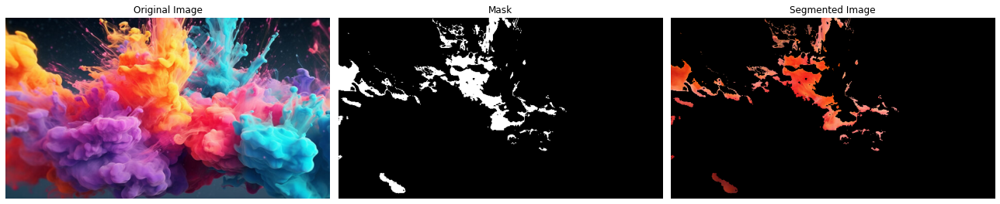

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_color_thresholding(hsv_image, lower_bound, upper_bound):
    """
    Apply color-based thresholding to segment objects of a specific color.
    """
    mask = cv2.inRange(hsv_image, lower_bound, upper_bound)
    
    segmented_image = cv2.bitwise_and(hsv_image, hsv_image, mask=mask)
    return mask, segmented_image

def display_images(original, mask, segmented):
    """
    Display the original image, mask, and segmented image.
    """
    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.title('Original Image')
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Mask')
    plt.imshow(mask, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Segmented Image')
    plt.imshow(cv2.cvtColor(segmented, cv2.COLOR_HSV2RGB))
    plt.axis('off')

    plt.tight_layout()
    plt.show()

image_path = 'colors.jpg'  
image = cv2.imread(image_path)

if image is None:
    raise FileNotFoundError(f"The image at {image_path} could not be found.")

hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)


lower_bound = np.array([0, 100, 100])  
upper_bound = np.array([10, 255, 255])  

mask, segmented_image = apply_color_thresholding(hsv_image, lower_bound, upper_bound)

display_images(image, mask, segmented_image)


Observation:

Effective Isolation of Specific Colors:

- The color-based segmentation successfully isolates objects of the specified color in the image. This approach works well in scenes where different objects have distinct colors, allowing for clear segmentation based on those colors.

Robustness to Lighting Conditions:

- The HSV color space enhances the robustness of segmentation to variations in lighting. Since Hue is independent of intensity, objects of the same color are consistently segmented even if the brightness varies across the image.
- Saturation and Value ranges help in fine-tuning the segmentation to avoid including irrelevant parts of the image, such as shadows or overly bright regions that might otherwise interfere with color detection.
Threshold Sensitivity:

- The choice of thresholds for Hue, Saturation, and Value is critical. Incorrect thresholds can lead to partial segmentation (missing parts of the object) or inclusion of unwanted areas (false positives).
- For instance, setting the Hue range too broad might include similar but undesired colors, while too narrow a range might exclude parts of the object that vary slightly in color due to shading or reflection.

Conclusion:

- Precision in Object Segmentation: Color-based segmentation using the HSV color space is highly effective for isolating objects based on their color, making it a powerful tool in applications like object detection, tracking, and scene understanding. The separation of chromatic and intensity information in HSV allows for more precise segmentation, particularly in complex images with varying lighting conditions.

- Threshold Selection is Key: The success of color-based segmentation hinges on the careful selection of Hue, Saturation, and Value thresholds. These thresholds need to be adjusted according to the specific colors and lighting conditions in the image to achieve accurate segmentation without false positives or negatives.

- Versatility and Applications: This method is versatile and can be applied across a range of applications, such as detecting specific colored objects in images, segmenting objects for further analysis, or isolating parts of an image for further processing. It's particularly useful in fields like robotics, medical imaging, and surveillance, where color information is a primary cue for identifying objects.

# AS-1(b)

## Negative Transform

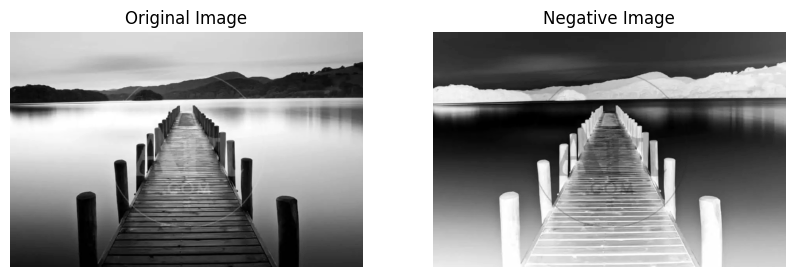

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


image_path = 'landscape.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if image is None:
    raise FileNotFoundError(f"The image at {image_path} could not be found.")


negative_image = 255 - image

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Negative Image')
plt.imshow(negative_image, cmap='gray')
plt.axis('off')

plt.show()

Observation: The image negative transformation inverts the pixel values, converting bright areas to dark and dark areas to bright. This effect is particularly useful for analyzing images where the original brightness distribution may obscure details.


Conclusion: Image negatives are effective for highlighting details that are not easily visible in the original image, especially in images with high contrast.

## Gamma Correction

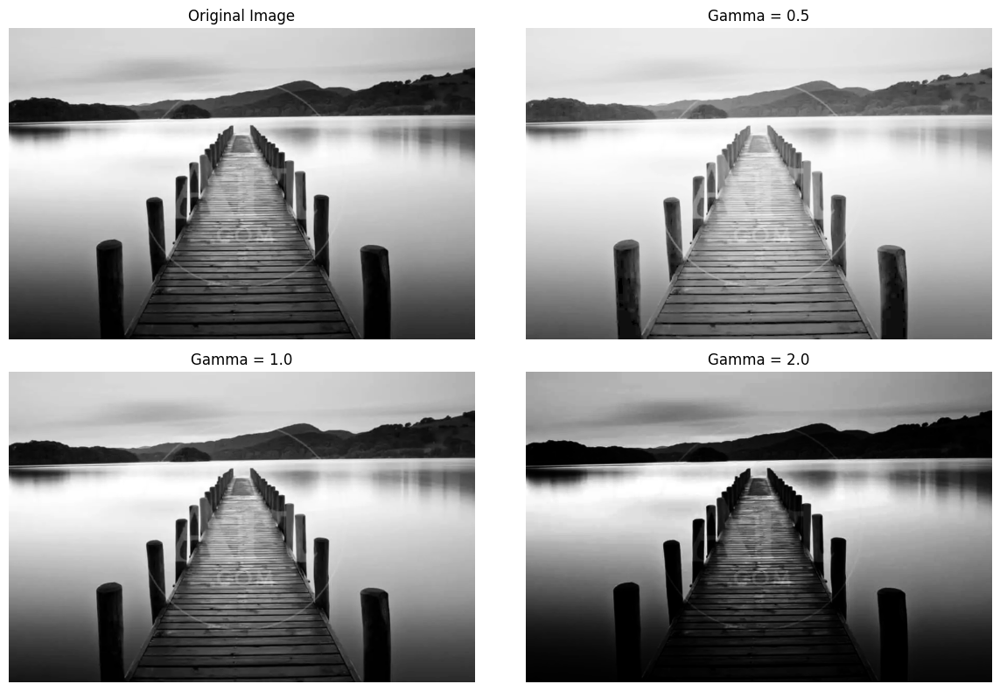

In [2]:
def apply_gamma_correction(image, gamma):
    """
    Apply gamma correction to the image.
    """
    image_normalized = image / 255.0
    corrected_image = np.power(image_normalized, gamma)
    corrected_image = np.uint8(corrected_image * 255)
    return corrected_image

image_path = 'landscape.jpg'  
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if image is None:
    raise FileNotFoundError(f"The image at {image_path} could not be found.")

gamma_values = [0.5, 1.0, 2.0]
gamma_corrected_images = [apply_gamma_correction(image, gamma) for gamma in gamma_values]

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

for i, gamma in enumerate(gamma_values):
    plt.subplot(2, 2, i+2)
    plt.title(f'Gamma = {gamma}')
    plt.imshow(gamma_corrected_images[i], cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

Observation: Gamma correction adjusts the brightness of an image:
γ = 0.5: Brightens the image, making darker regions more visible.
γ = 1.0: The image remains unchanged, serving as a reference.
γ = 2.0: Darkens the image, emphasizing brighter regions and reducing the visibility of darker regions.

Conclusion: Gamma correction allows for flexible brightness adjustments, making it useful for enhancing details in underexposed or overexposed images.

## Log Transform

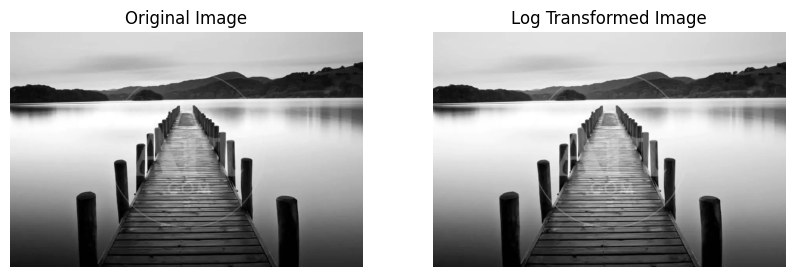

In [3]:
def apply_log_transformation(image):
    """
    Apply logarithmic transformation to the image.
    """
    image_float = image.astype(np.float32)
    
    image_normalized = image_float / 255.0
    
    log_transformed = np.log1p(image_normalized)
    
    log_transformed_normalized = cv2.normalize(log_transformed, None, 0, 255, cv2.NORM_MINMAX)
    
    log_transformed_image = np.uint8(log_transformed_normalized)
    
    return log_transformed_image

image_path = 'landscape.jpg'  
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if image is None:
    raise FileNotFoundError(f"The image at {image_path} could not be found.")

log_transformed_image = apply_log_transformation(image)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Log Transformed Image')
plt.imshow(log_transformed_image, cmap='gray')
plt.axis('off')

plt.show()

Observation: Log transformation compresses the range of pixel values, making darker regions more prominent while reducing the brightness of lighter regions. This can help in enhancing low-intensity details.

Conclusion: Log transformation is particularly effective for enhancing the visibility of details in darker regions, making it useful for images with large intensity variations.

## Compare Transform

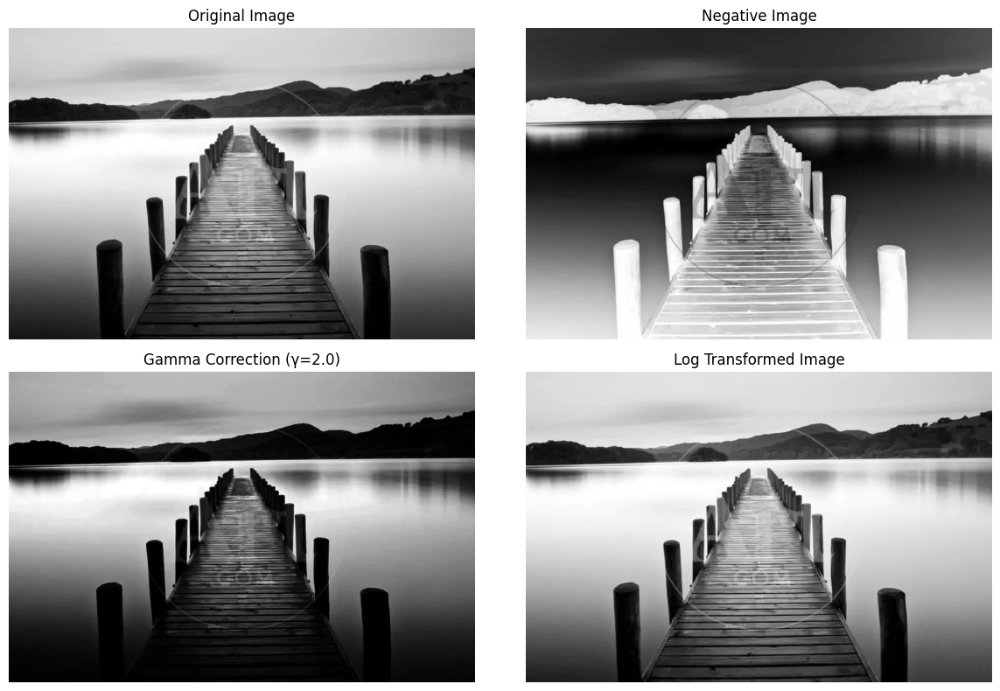

In [4]:
def apply_image_negative(image):
    """
    Apply image negative transformation.
    """
    return 255 - image

def apply_gamma_correction(image, gamma):
    """
    Apply gamma correction to the image.
    """
    image_normalized = image / 255.0
    corrected_image = np.power(image_normalized, gamma)
    corrected_image = np.uint8(corrected_image * 255)
    return corrected_image

def apply_log_transformation(image):
    """
    Apply logarithmic transformation to the image.
    """
    image_float = image.astype(np.float32)
    
    image_normalized = image_float / 255.0
    
    log_transformed = np.log1p(image_normalized)
    
    log_transformed_normalized = cv2.normalize(log_transformed, None, 0, 255, cv2.NORM_MINMAX)
    
    log_transformed_image = np.uint8(log_transformed_normalized)
    
    return log_transformed_image

image_path = 'landscape.jpg'  
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if image is None:
    raise FileNotFoundError(f"The image at {image_path} could not be found.")

negative_image = apply_image_negative(image)
gamma_corrected_image = apply_gamma_correction(image, gamma=2.0)
log_transformed_image = apply_log_transformation(image)

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Negative Image')
plt.imshow(negative_image, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.title('Gamma Correction (γ=2.0)')
plt.imshow(gamma_corrected_image, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.title('Log Transformed Image')
plt.imshow(log_transformed_image, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

Observation: Each transformation affects the image differently:
- Image Negative: Inverts brightness, emphasizing contrast.
- Gamma Correction (γ = 2.0): Darkens the image, highlighting brighter regions.
- Log Transformation: Enhances dark regions by compressing intensity values.

Conclusion: The choice of transformation depends on the specific enhancement needed. For contrast inversion, image negative is ideal; for brightness adjustments, gamma correction is preferred; and for enhancing dark areas, log transformation is most effective.

## Apply Transformation to Color Images

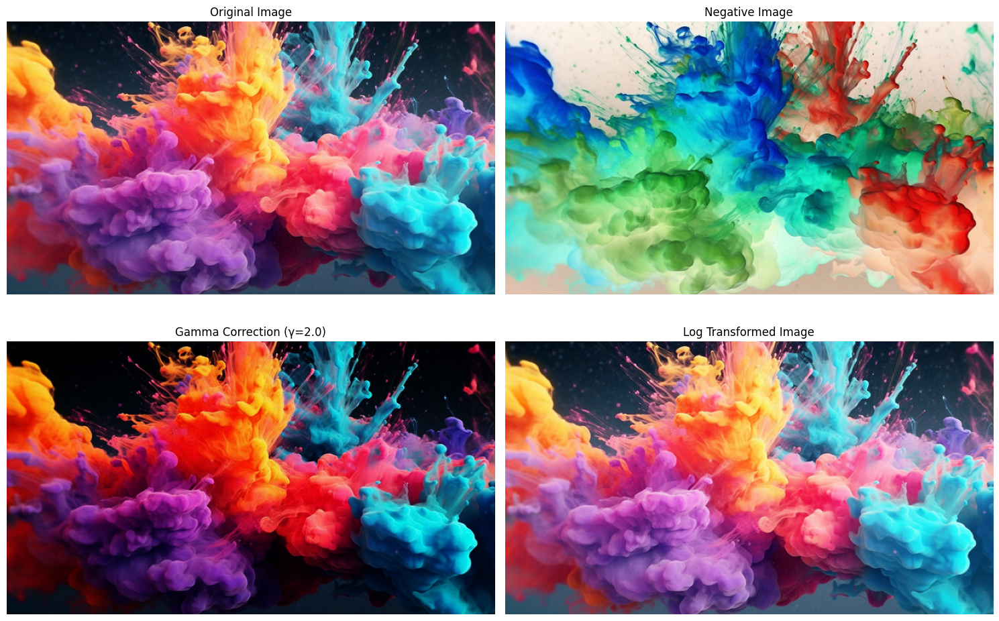

In [5]:
def apply_image_negative(image):
    """
    Apply image negative transformation to each channel.
    """
    return 255 - image

def apply_gamma_correction(image, gamma):
    """
    Apply gamma correction to each channel.
    """
    image_normalized = image / 255.0
    corrected_image = np.power(image_normalized, gamma)
    corrected_image = np.uint8(corrected_image * 255)
    return corrected_image

def apply_log_transformation(image):
    """
    Apply logarithmic transformation to each channel.
    """
    image_float = image.astype(np.float32)
    
    image_normalized = image_float / 255.0
    
    log_transformed = np.log1p(image_normalized)
    
    log_transformed_normalized = cv2.normalize(log_transformed, None, 0, 255, cv2.NORM_MINMAX)
    
    log_transformed_image = np.uint8(log_transformed_normalized)
    
    return log_transformed_image

def process_color_image(image):
    """
    Apply transformations to each channel of the color image.
    """
    b_channel, g_channel, r_channel = cv2.split(image)
    
    b_negative = apply_image_negative(b_channel)
    g_negative = apply_image_negative(g_channel)
    r_negative = apply_image_negative(r_channel)
    negative_image = cv2.merge([b_negative, g_negative, r_negative])
    
    b_gamma = apply_gamma_correction(b_channel, gamma=2.0)
    g_gamma = apply_gamma_correction(g_channel, gamma=2.0)
    r_gamma = apply_gamma_correction(r_channel, gamma=2.0)
    gamma_corrected_image = cv2.merge([b_gamma, g_gamma, r_gamma])
    
    b_log = apply_log_transformation(b_channel)
    g_log = apply_log_transformation(g_channel)
    r_log = apply_log_transformation(r_channel)
    log_transformed_image = cv2.merge([b_log, g_log, r_log])
    
    return negative_image, gamma_corrected_image, log_transformed_image

image_path = 'colors.jpg'  
image = cv2.imread(image_path)

if image is None:
    raise FileNotFoundError(f"The image at {image_path} could not be found.")

negative_image, gamma_corrected_image, log_transformed_image = process_color_image(image)

plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Negative Image')
plt.imshow(cv2.cvtColor(negative_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 2, 3)
plt.title('Gamma Correction (γ=2.0)')
plt.imshow(cv2.cvtColor(gamma_corrected_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 2, 4)
plt.title('Log Transformed Image')
plt.imshow(cv2.cvtColor(log_transformed_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

Observation: Applying transformations to each color channel (R, G, B) individually affects the color balance:
- Image Negative: Produces a color-inverted image.
- Gamma Correction: Adjusts the brightness of each color channel, altering the overall color tone.
- Log Transformation: Enhances low-intensity regions across all channels, leading to a more uniform enhancement.

Conclusion: Applying these transformations to color images requires careful consideration of how each channel is affected, as this can significantly change the overall appearance and color balance of the image.

# AS-1(c)

## Task-1 Introduction to Histogram Equalization

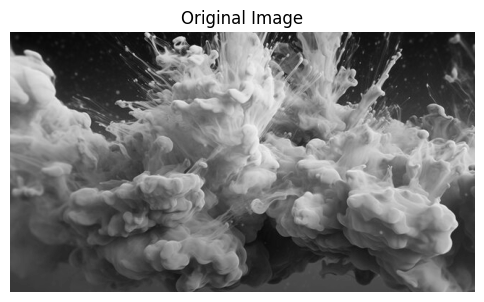

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load a grayscale image
image = cv2.imread('colors.jpg', cv2.IMREAD_GRAYSCALE)

# Display the original image
plt.figure(figsize=(6,6))
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.show()

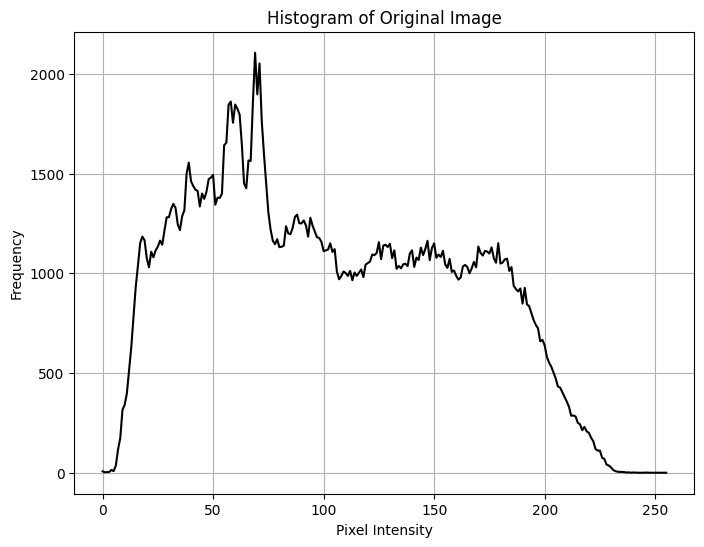

In [7]:
# Calculate the histogram
histogram = np.zeros(256)
for pixel in image.flatten():
    histogram[pixel] += 1

# Plot the histogram
plt.figure(figsize=(8,6))
plt.plot(histogram, color='black')
plt.title('Histogram of Original Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


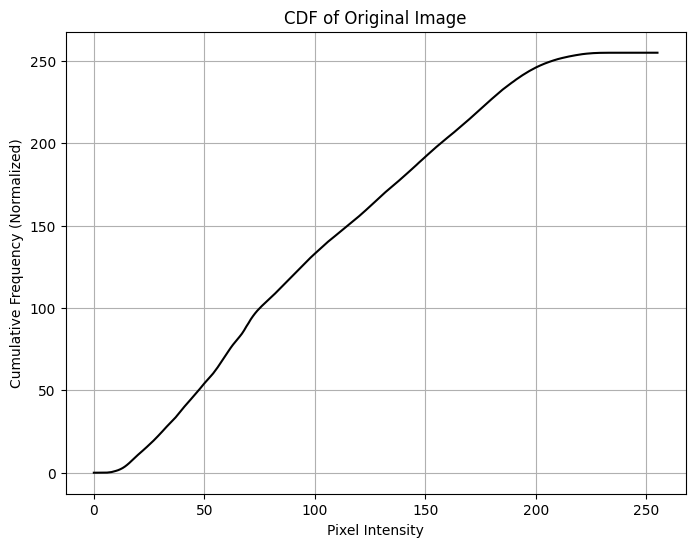

In [8]:
# Calculate the CDF
cdf = histogram.cumsum()

# Normalize the CDF to the range [0, 255]
cdf_normalized = cdf * 255 / cdf[-1]

# Plot the CDF
plt.figure(figsize=(8,6))
plt.plot(cdf_normalized, color='black')
plt.title('CDF of Original Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Cumulative Frequency (Normalized)')
plt.grid(True)
plt.show()

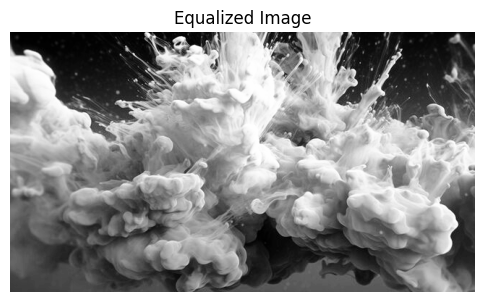

In [9]:
# Apply histogram equalization
equalized_image = np.interp(image.flatten(), range(0, 256), cdf_normalized).reshape(image.shape).astype('uint8')

# Display the equalized image
plt.figure(figsize=(6,6))
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')
plt.show()

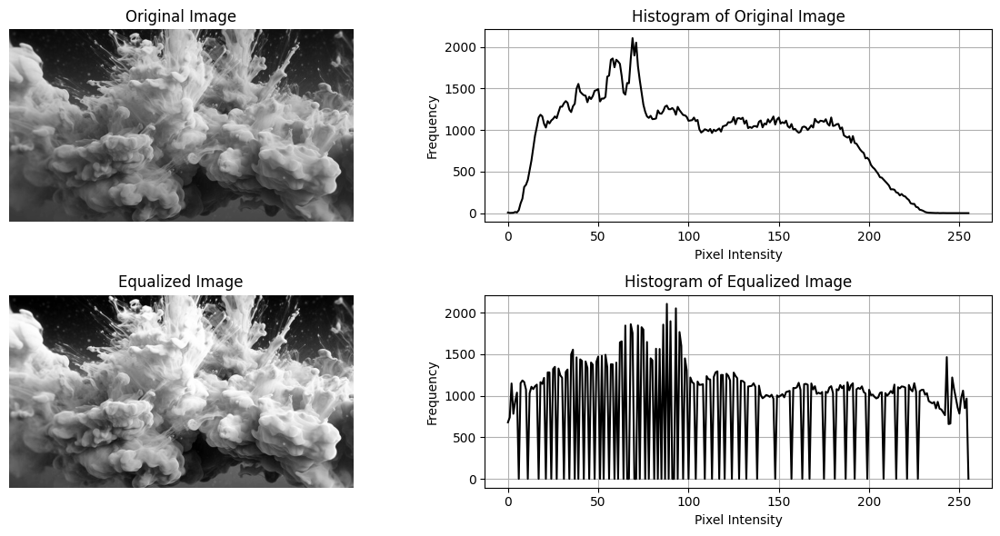

In [10]:
# Plot the histogram of the equalized image
histogram_eq = np.zeros(256)
for pixel in equalized_image.flatten():
    histogram_eq[pixel] += 1

plt.figure(figsize=(12,6))

# Original image and histogram
plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.plot(histogram, color='black')
plt.title('Histogram of Original Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.grid(True)

# Equalized image and histogram
plt.subplot(2, 2, 3)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.plot(histogram_eq, color='black')
plt.title('Histogram of Equalized Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.grid(True)

plt.tight_layout()
plt.show()

Observation: Histogram equalization effectively redistributes the pixel intensities across the entire range, resulting in enhanced image contrast. The process stretches the intensity values to cover the entire spectrum, thereby revealing details in both dark and bright regions that were previously hidden. The histogram of the equalized image becomes more uniform, indicating a better spread of intensity values.

Conclusion: Histogram equalization is a fundamental technique for improving the contrast of grayscale images. By spreading out the most frequent intensity values, it enhances the visibility of features, making it particularly useful for images with poor contrast or uneven lighting.

# Task-2: Comparing Histogram Equalization Techniques

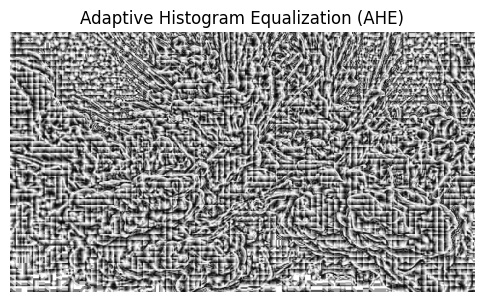

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the grayscale image
image = cv2.imread('colors.jpg', cv2.IMREAD_GRAYSCALE)

# Set parameters for AHE
tile_size = 8  # Size of the tiles (e.g., 8x8)
height, width = image.shape
output_ahe = np.zeros((height, width), dtype='uint8')

# Apply AHE to each tile
for i in range(0, height, tile_size):
    for j in range(0, width, tile_size):
        # Extract the tile
        tile = image[i:i+tile_size, j:j+tile_size]

        # Apply histogram equalization to the tile
        tile_hist = np.zeros(256)
        for pixel in tile.flatten():
            tile_hist[pixel] += 1
        tile_cdf = tile_hist.cumsum()
        tile_cdf_normalized = tile_cdf * 255 / tile_cdf[-1]
        tile_equalized = np.interp(tile.flatten(), range(256), tile_cdf_normalized).reshape(tile.shape).astype('uint8')

        # Place the equalized tile in the output image
        output_ahe[i:i+tile_size, j:j+tile_size] = tile_equalized

# Display the AHE image
plt.figure(figsize=(6,6))
plt.imshow(output_ahe, cmap='gray')
plt.title('Adaptive Histogram Equalization (AHE)')
plt.axis('off')
plt.show()

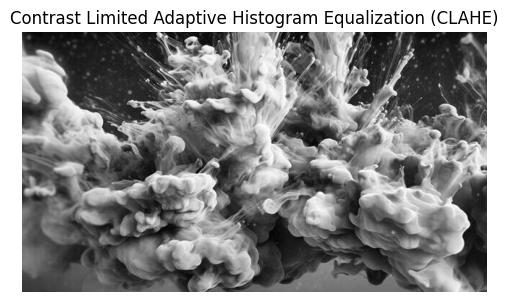

In [12]:
# Apply CLAHE
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
output_clahe = clahe.apply(image)

# Display the CLAHE image
plt.figure(figsize=(6,6))
plt.imshow(output_clahe, cmap='gray')
plt.title('Contrast Limited Adaptive Histogram Equalization (CLAHE)')
plt.axis('off')
plt.show()

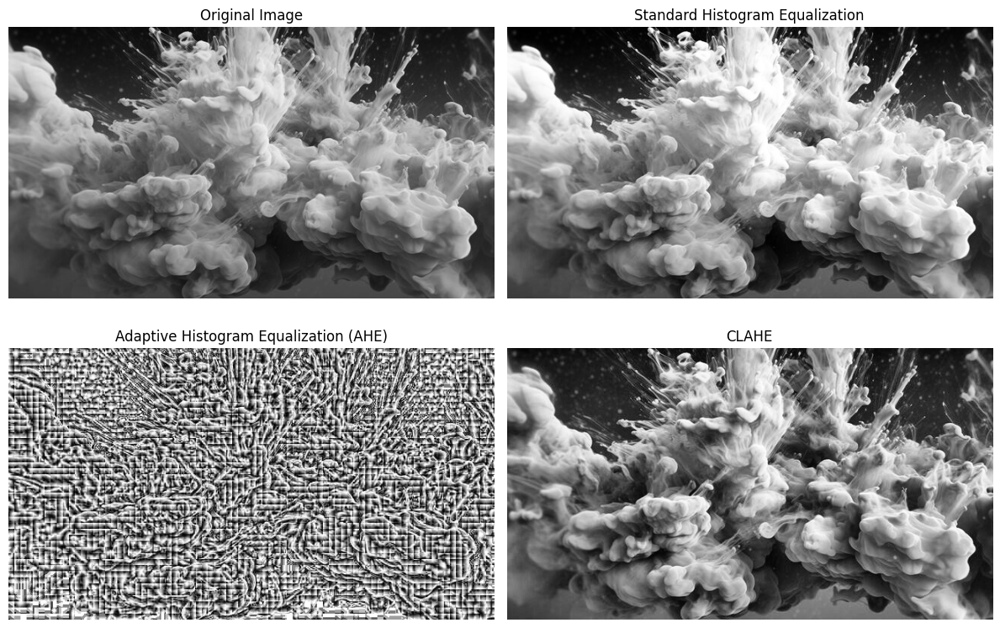

In [13]:
# Apply standard histogram equalization for comparison
output_standard = cv2.equalizeHist(image)

# Display all images side by side
plt.figure(figsize=(12, 8))

# Original image
plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Standard histogram equalization
plt.subplot(2, 2, 2)
plt.imshow(output_standard, cmap='gray')
plt.title('Standard Histogram Equalization')
plt.axis('off')

# Adaptive histogram equalization (AHE)
plt.subplot(2, 2, 3)
plt.imshow(output_ahe, cmap='gray')
plt.title('Adaptive Histogram Equalization (AHE)')
plt.axis('off')

# Contrast Limited Adaptive Histogram Equalization (CLAHE)
plt.subplot(2, 2, 4)
plt.imshow(output_clahe, cmap='gray')
plt.title('CLAHE')
plt.axis('off')

plt.tight_layout()
plt.show()

Observation: Adaptive Histogram Equalization (AHE) divides the image into smaller regions (tiles) and applies histogram equalization locally, enhancing the contrast in each region individually. However, AHE can sometimes over-amplify noise in regions with minimal variation. Contrast Limited Adaptive Histogram Equalization (CLAHE) addresses this by limiting the contrast in these regions, preventing the over-amplification of noise and providing a more balanced enhancement.

Conclusion: While standard AHE can significantly improve local contrast, it may lead to noise issues in homogeneous regions. CLAHE, by limiting the contrast amplification, offers a more controlled and visually pleasing result, making it more suitable for real-world applications where noise is a concern.

# Task-3: Implementing Histogram Equalization on Color Images

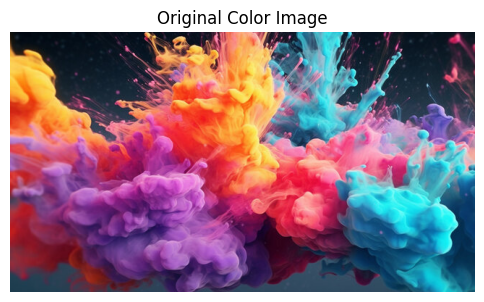

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load a color image
color_image = cv2.imread('colors.jpg')
color_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB for display

# Display the original color image
plt.figure(figsize=(6,6))
plt.imshow(color_image)
plt.title('Original Color Image')
plt.axis('off')
plt.show()

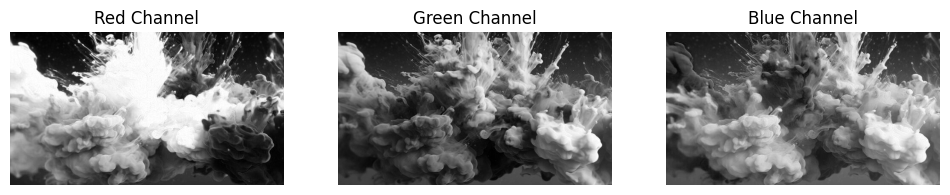

In [15]:
# Split the image into R, G, B channels
r_channel, g_channel, b_channel = cv2.split(color_image)

# Display the R, G, B channels
plt.figure(figsize=(12,4))

plt.subplot(1, 3, 1)
plt.imshow(r_channel, cmap='gray')
plt.title('Red Channel')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(g_channel, cmap='gray')
plt.title('Green Channel')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(b_channel, cmap='gray')
plt.title('Blue Channel')
plt.axis('off')

plt.show()

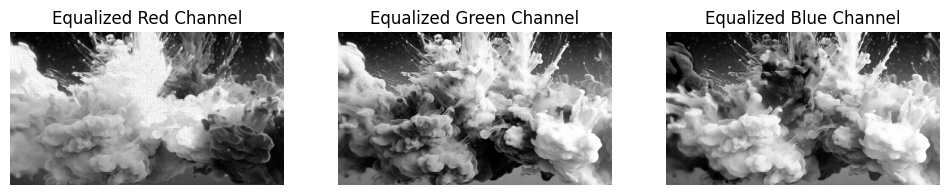

In [16]:
# Apply histogram equalization to each channel
r_equalized = cv2.equalizeHist(r_channel)
g_equalized = cv2.equalizeHist(g_channel)
b_equalized = cv2.equalizeHist(b_channel)

# Display the equalized channels
plt.figure(figsize=(12,4))

plt.subplot(1, 3, 1)
plt.imshow(r_equalized, cmap='gray')
plt.title('Equalized Red Channel')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(g_equalized, cmap='gray')
plt.title('Equalized Green Channel')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(b_equalized, cmap='gray')
plt.title('Equalized Blue Channel')
plt.axis('off')

plt.show()

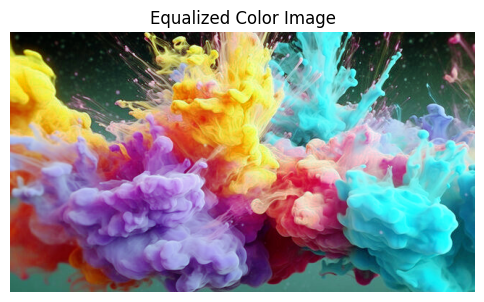

In [17]:
# Merge the equalized channels back into a color image
equalized_color_image = cv2.merge((r_equalized, g_equalized, b_equalized))

# Display the equalized color image
plt.figure(figsize=(6,6))
plt.imshow(equalized_color_image)
plt.title('Equalized Color Image')
plt.axis('off')
plt.show()

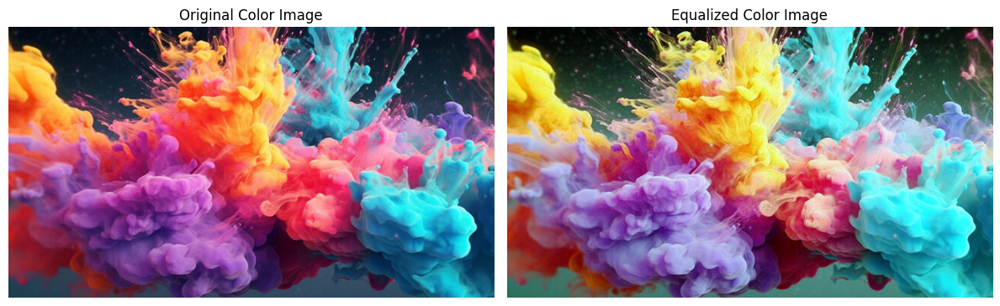

In [18]:
# Display original and equalized images side by side
plt.figure(figsize=(12,6))

plt.subplot(1, 2, 1)
plt.imshow(color_image)
plt.title('Original Color Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_color_image)
plt.title('Equalized Color Image')
plt.axis('off')

plt.tight_layout()
plt.show()


Observation: When applying histogram equalization to color images by processing each RGB channel separately, the image’s overall color balance can be altered. This occurs because each channel is equalized independently, which may lead to unnatural color shifts. The result is an image with enhanced contrast but potentially distorted colors. Alternatively, applying equalization in other color spaces, such as HSV or Lab, where intensity and color information are separated, can preserve color balance better.

Conclusion: While histogram equalization enhances contrast effectively in grayscale images, its application to color images requires caution. Independent channel equalization can lead to color distortions, so alternative approaches or careful adjustments are needed to maintain natural color appearance while still enhancing contrast.

## Task 4: Histogram Equalization in Different Applications 

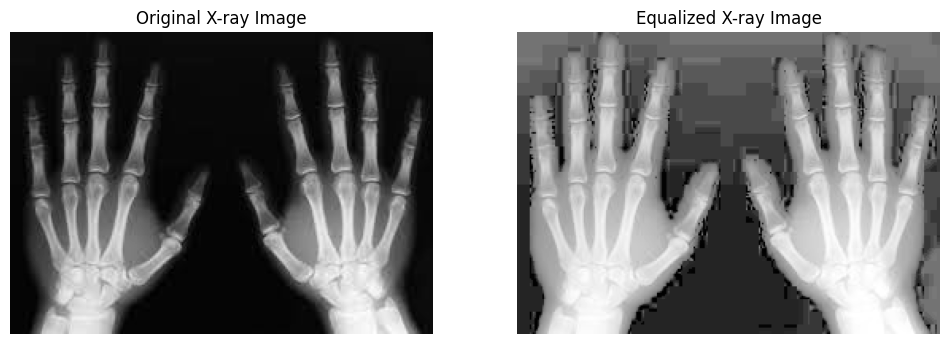

In [19]:
# Load a medical image (e.g., an X-ray image)
xray_image = cv2.imread('xray.jpeg', cv2.IMREAD_GRAYSCALE)

# Apply histogram equalization
xray_equalized = cv2.equalizeHist(xray_image)

# Display the original and equalized X-ray images
plt.figure(figsize=(12,6))

plt.subplot(1, 2, 1)
plt.imshow(xray_image, cmap='gray')
plt.title('Original X-ray Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(xray_equalized, cmap='gray')
plt.title('Equalized X-ray Image')
plt.axis('off')

plt.show()

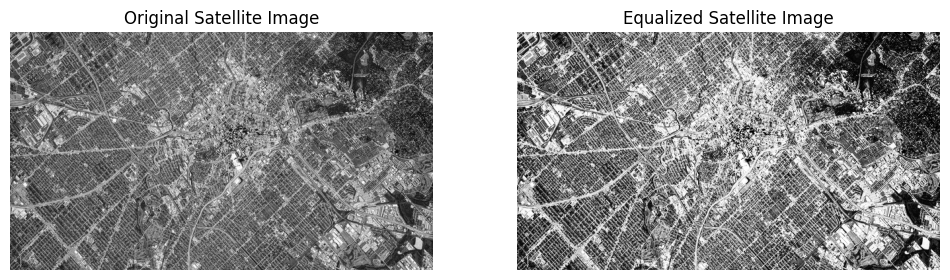

In [35]:
# Load a satellite image
sat_image = cv2.imread('sat.jpg', cv2.IMREAD_GRAYSCALE)

# Apply histogram equalization
sat_equalized = cv2.equalizeHist(sat_image)

# Display the original and equalized satellite images
plt.figure(figsize=(12,6))

plt.subplot(1, 2, 1)
plt.imshow(sat_image, cmap='gray')
plt.title('Original Satellite Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sat_equalized, cmap='gray')
plt.title('Equalized Satellite Image')
plt.axis('off')

plt.show()

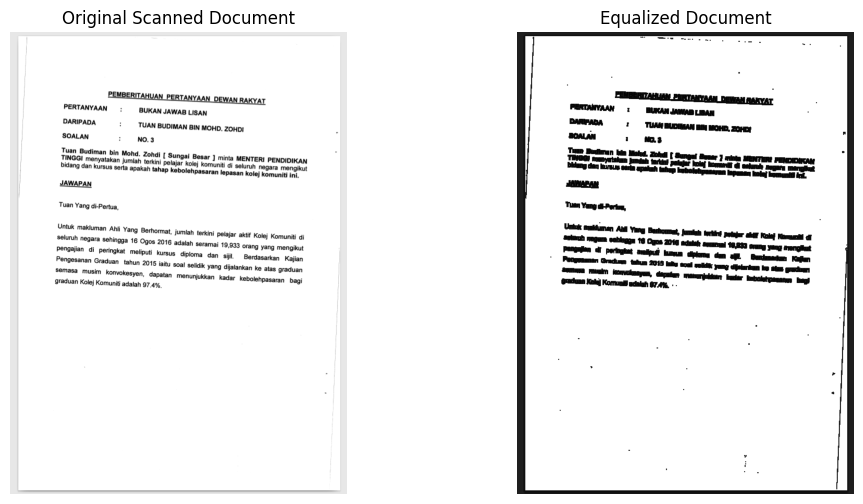

In [21]:
# Load a scanned document image
doc_image = cv2.imread('scan.png', cv2.IMREAD_GRAYSCALE)

# Apply histogram equalization
doc_equalized = cv2.equalizeHist(doc_image)

# Display the original and equalized document images
plt.figure(figsize=(12,6))

plt.subplot(1, 2, 1)
plt.imshow(doc_image, cmap='gray')
plt.title('Original Scanned Document')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(doc_equalized, cmap='gray')
plt.title('Equalized Document')
plt.axis('off')

plt.show()

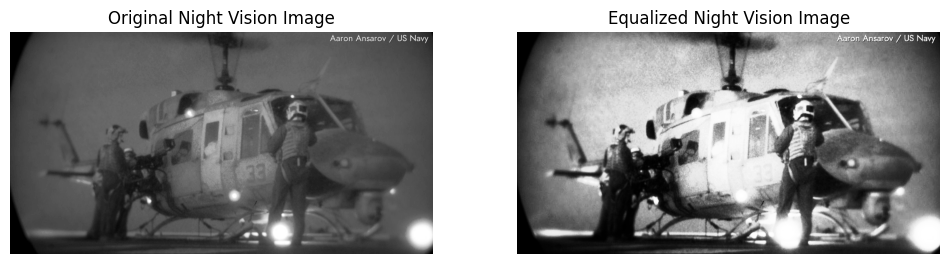

In [22]:
# Load a night vision image
night_vision_image = cv2.imread('night.jpg', cv2.IMREAD_GRAYSCALE)

# Apply histogram equalization
night_equalized = cv2.equalizeHist(night_vision_image)

# Display the original and equalized night vision images
plt.figure(figsize=(12,6))

plt.subplot(1, 2, 1)
plt.imshow(night_vision_image, cmap='gray')
plt.title('Original Night Vision Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(night_equalized, cmap='gray')
plt.title('Equalized Night Vision Image')
plt.axis('off')

plt.show()

Observation: Histogram equalization proves to be highly effective across various domains:
- Medical Imaging: Enhances the visibility of critical features in medical scans like X-rays and MRIs, making it easier to detect anomalies.
- Satellite Imagery: Improves contrast and reveals finer details in satellite images, aiding in better terrain and object analysis.
- Document Scanning: Increases the readability of scanned documents by enhancing text contrast against the background.
- Night Vision: Improves the visibility of objects in night vision images, which typically suffer from low contrast due to poor lighting conditions.

Conclusion: Histogram equalization is a versatile tool that enhances image quality in diverse fields. Its ability to reveal hidden details and improve contrast makes it invaluable for applications where visual clarity is essential, such as in medical diagnostics, remote sensing, and document processing.

## Task 5: Histogram Equalization for Low Contrast Images

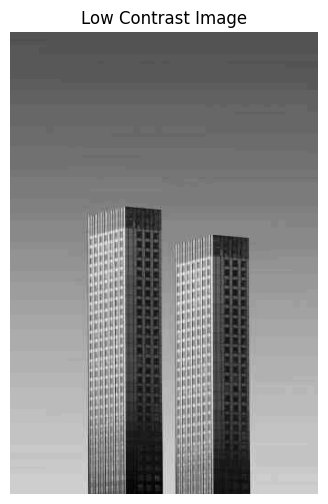

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an example image
image = cv2.imread('lowcon.jpg', cv2.IMREAD_GRAYSCALE)

# Simulate a low contrast image by scaling the intensity values
low_contrast_image = np.clip(0.5 * image + 50, 0, 255).astype('uint8')

# Display the low contrast image
plt.figure(figsize=(6,6))
plt.imshow(low_contrast_image, cmap='gray')
plt.title('Low Contrast Image')
plt.axis('off')
plt.show()

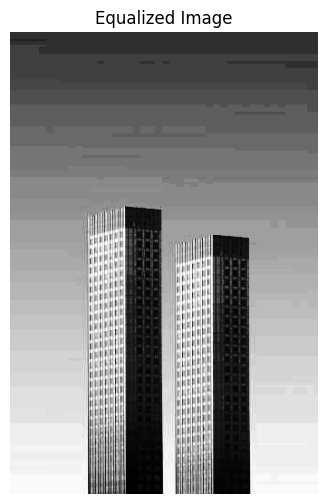

In [24]:
# Apply histogram equalization
equalized_image = cv2.equalizeHist(low_contrast_image)

# Display the equalized image
plt.figure(figsize=(6,6))
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')
plt.show()

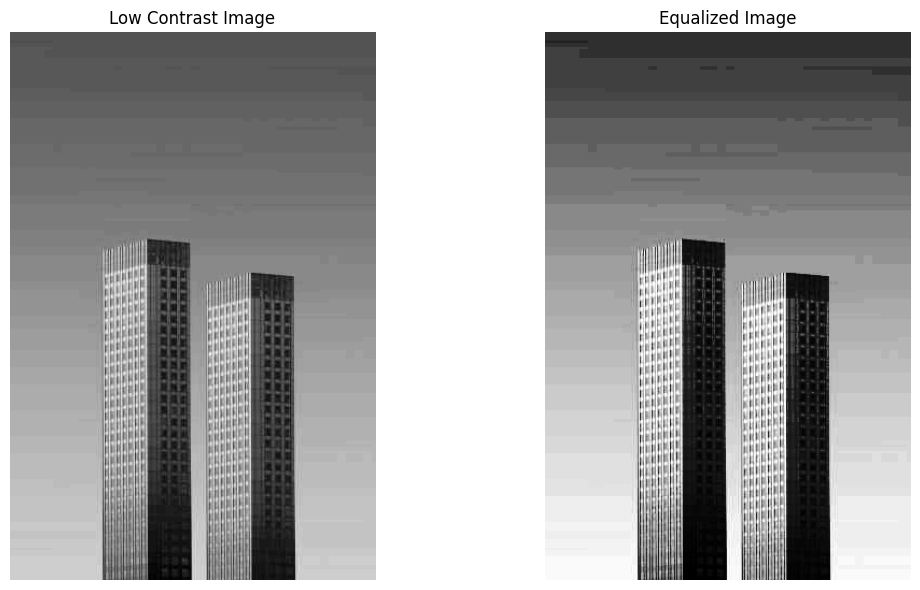

In [25]:
# Display the original and equalized images side by side
plt.figure(figsize=(12,6))

plt.subplot(1, 2, 1)
plt.imshow(low_contrast_image, cmap='gray')
plt.title('Low Contrast Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

plt.tight_layout()
plt.show()

Observation: Applying histogram equalization to low-contrast images results in a significant improvement in the visibility of features. The transformation expands the dynamic range of the image, spreading out the intensity values and making details in both shadowed and highlighted areas more discernible. This is especially useful for images where the contrast is uniformly low or where the intensity values are clustered around a narrow range.

Conclusion: Histogram equalization is highly effective for enhancing low-contrast images, making it an ideal solution for improving the visibility of features that would otherwise remain obscured. This technique is particularly beneficial in situations where the original image has uniform intensity distribution, as it maximizes the dynamic range and enhances overall image clarity.

## Task 6: Multi-Scale Histogram Equalization

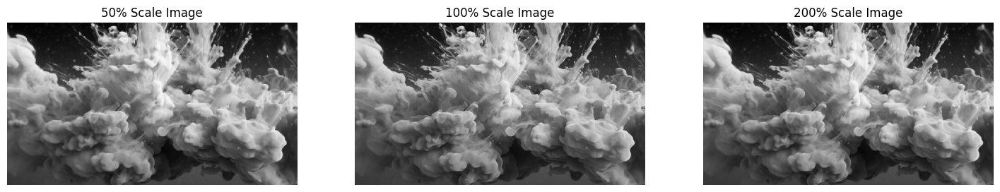

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an example image
image = cv2.imread('colors.jpg', cv2.IMREAD_GRAYSCALE)

# Resize the image to different scales
image_50 = cv2.resize(image, (0, 0), fx=0.5, fy=0.5)
image_100 = image  # 100% scale is the original image
image_200 = cv2.resize(image, (0, 0), fx=2.0, fy=2.0)

# Display the images at different scales
plt.figure(figsize=(18,6))

plt.subplot(1, 3, 1)
plt.imshow(image_50, cmap='gray')
plt.title('50% Scale Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(image_100, cmap='gray')
plt.title('100% Scale Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(image_200, cmap='gray')
plt.title('200% Scale Image')
plt.axis('off')

plt.show()


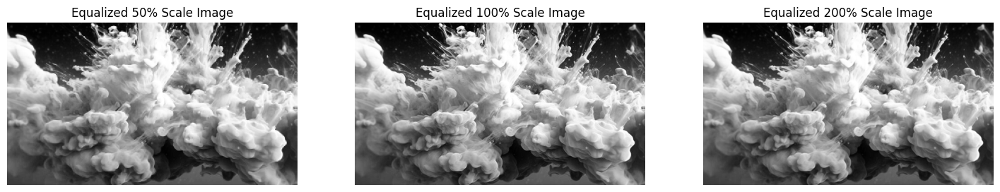

In [27]:
# Apply histogram equalization to each scaled image
equalized_50 = cv2.equalizeHist(image_50)
equalized_100 = cv2.equalizeHist(image_100)
equalized_200 = cv2.equalizeHist(image_200)

# Display the equalized images
plt.figure(figsize=(18,6))

plt.subplot(1, 3, 1)
plt.imshow(equalized_50, cmap='gray')
plt.title('Equalized 50% Scale Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(equalized_100, cmap='gray')
plt.title('Equalized 100% Scale Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(equalized_200, cmap='gray')
plt.title('Equalized 200% Scale Image')
plt.axis('off')

plt.show()

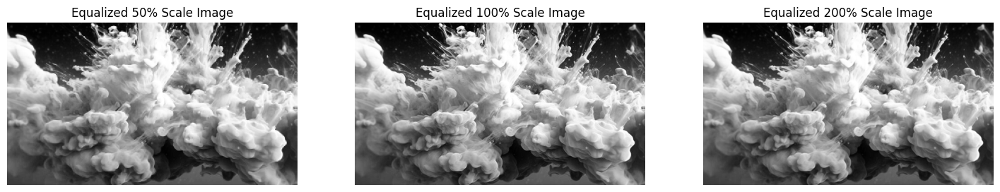

In [28]:
# Compare the equalized images at different scales
plt.figure(figsize=(18,6))

# 50% scale equalized image
plt.subplot(1, 3, 1)
plt.imshow(equalized_50, cmap='gray')
plt.title('Equalized 50% Scale Image')
plt.axis('off')

# 100% scale equalized image
plt.subplot(1, 3, 2)
plt.imshow(equalized_100, cmap='gray')
plt.title('Equalized 100% Scale Image')
plt.axis('off')

# 200% scale equalized image
plt.subplot(1, 3, 3)
plt.imshow(equalized_200, cmap='gray')
plt.title('Equalized 200% Scale Image')
plt.axis('off')

plt.show()

Observation: Applying histogram equalization at different scales affects the image’s detail and overall appearance. When the image is resized to different scales (e.g., 50%, 100%, 200%), the effect of histogram equalization changes accordingly. Larger scales tend to preserve global contrast and image structure, while smaller scales enhance local details more prominently. This can be useful for analyzing features at different levels of magnification or for emphasizing certain details depending on the scale.

Conclusion: The scale at which histogram equalization is applied can significantly influence the outcome. Larger scales help maintain a balance between global contrast and detail, while smaller scales can enhance specific features. This flexibility allows for tailored image enhancement depending on the desired level of detail and the specific requirements of the analysis.

## Task 7: Histogram Equalization for Image Enhancement

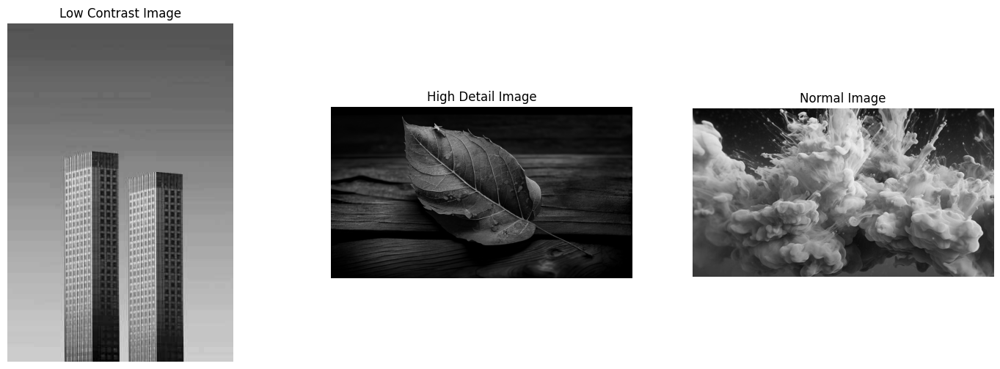

In [29]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load images with varying levels of detail and contrast
low_contrast_image = cv2.imread('lowcon.jpg', cv2.IMREAD_GRAYSCALE)
high_detail_image = cv2.imread('highcon.jpg', cv2.IMREAD_GRAYSCALE)
normal_image = cv2.imread('colors.jpg', cv2.IMREAD_GRAYSCALE)

# Display the original images
plt.figure(figsize=(18,6))

plt.subplot(1, 3, 1)
plt.imshow(low_contrast_image, cmap='gray')
plt.title('Low Contrast Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(high_detail_image, cmap='gray')
plt.title('High Detail Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(normal_image, cmap='gray')
plt.title('Normal Image')
plt.axis('off')

plt.show()

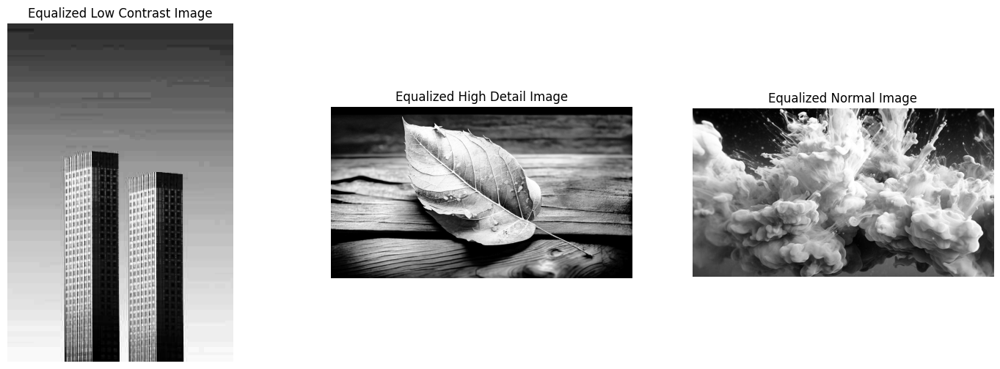

In [30]:
# Apply histogram equalization to each image
equalized_low_contrast = cv2.equalizeHist(low_contrast_image)
equalized_high_detail = cv2.equalizeHist(high_detail_image)
equalized_normal = cv2.equalizeHist(normal_image)

# Display the equalized images
plt.figure(figsize=(18,6))

plt.subplot(1, 3, 1)
plt.imshow(equalized_low_contrast, cmap='gray')
plt.title('Equalized Low Contrast Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(equalized_high_detail, cmap='gray')
plt.title('Equalized High Detail Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(equalized_normal, cmap='gray')
plt.title('Equalized Normal Image')
plt.axis('off')

plt.show()


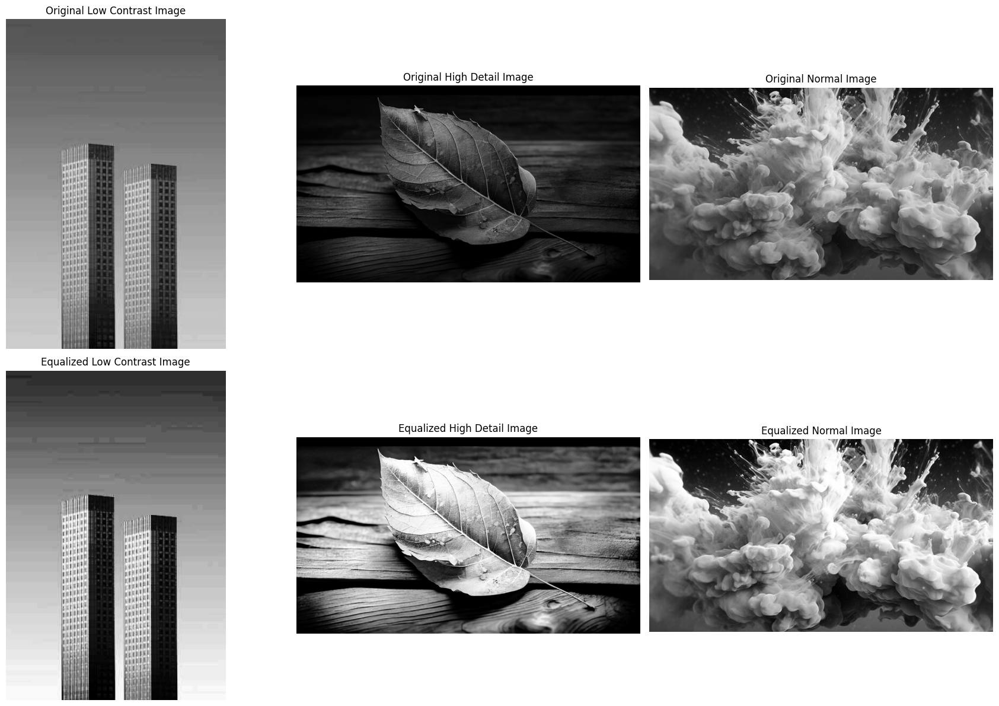

In [31]:
# Compare the original and equalized images side by side
plt.figure(figsize=(18,12))

# Low contrast image comparison
plt.subplot(2, 3, 1)
plt.imshow(low_contrast_image, cmap='gray')
plt.title('Original Low Contrast Image')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(equalized_low_contrast, cmap='gray')
plt.title('Equalized Low Contrast Image')
plt.axis('off')

# High detail image comparison
plt.subplot(2, 3, 2)
plt.imshow(high_detail_image, cmap='gray')
plt.title('Original High Detail Image')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(equalized_high_detail, cmap='gray')
plt.title('Equalized High Detail Image')
plt.axis('off')

# Normal image comparison
plt.subplot(2, 3, 3)
plt.imshow(normal_image, cmap='gray')
plt.title('Original Normal Image')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(equalized_normal, cmap='gray')
plt.title('Equalized Normal Image')
plt.axis('off')

plt.tight_layout()
plt.show()

Observation: When applied to images with varying levels of detail and contrast, histogram equalization consistently enhances clarity and detail. It is particularly effective in images where certain areas are too dark or too bright, as it redistributes intensity values to achieve a more balanced contrast. This results in an image that is easier to analyze and interpret, with previously obscured details becoming more prominent.

Conclusion: Histogram equalization is a powerful enhancement tool that improves the visibility of details across a wide range of images. Whether dealing with underexposed, overexposed, or high-contrast images, this technique helps achieve a clearer, more balanced image that is better suited for visual analysis.

## Task 8: Histogram Equalization in Image Segmentation 

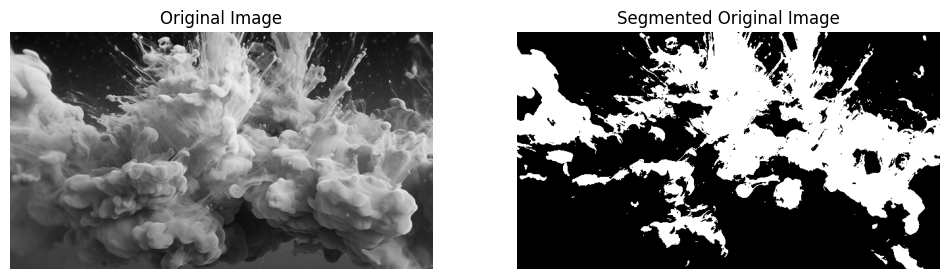

In [32]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an example image
image = cv2.imread('colors.jpg', cv2.IMREAD_GRAYSCALE)

# Apply a global threshold to segment the image
_, segmented_original = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

# Display the original image and its segmentation
plt.figure(figsize=(12,6))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_original, cmap='gray')
plt.title('Segmented Original Image')
plt.axis('off')

plt.show()

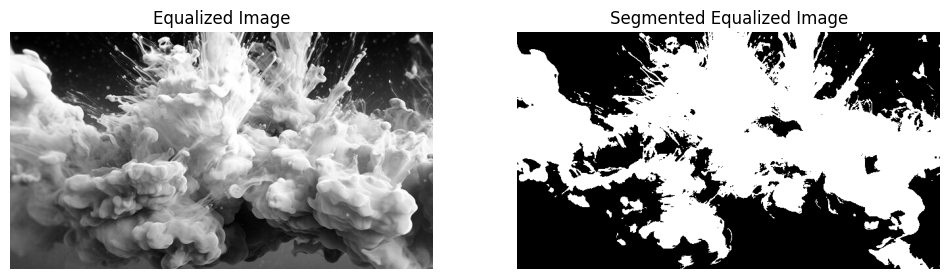

In [33]:
# Apply histogram equalization to the original image
equalized_image = cv2.equalizeHist(image)

# Perform segmentation on the equalized image
_, segmented_equalized = cv2.threshold(equalized_image, 127, 255, cv2.THRESH_BINARY)

# Display the equalized image and its segmentation
plt.figure(figsize=(12,6))

plt.subplot(1, 2, 1)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_equalized, cmap='gray')
plt.title('Segmented Equalized Image')
plt.axis('off')

plt.show()

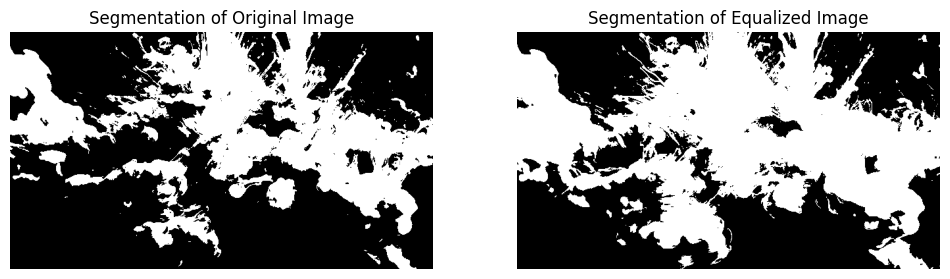

In [34]:
# Compare the segmentation results before and after histogram equalization
plt.figure(figsize=(12,6))

# Segmentation of the original image
plt.subplot(1, 2, 1)
plt.imshow(segmented_original, cmap='gray')
plt.title('Segmentation of Original Image')
plt.axis('off')

# Segmentation of the equalized image
plt.subplot(1, 2, 2)
plt.imshow(segmented_equalized, cmap='gray')
plt.title('Segmentation of Equalized Image')
plt.axis('off')

plt.show()

Observation: Applying histogram equalization before segmentation can significantly improve the segmentation process. By enhancing the contrast between different regions, histogram equalization makes boundaries more distinct, leading to more accurate segmentation. This is particularly important in thresholding and region-based segmentation methods, where clear contrast differences are essential for precise segmentation.

Conclusion: Histogram equalization enhances segmentation accuracy by improving the contrast between different image regions. This leads to more distinct boundaries and more effective segmentation, making it a valuable preprocessing step in various image analysis applications.

GitHub Link: https://github.com/TanishMahajan28/MachineVisionLab_21BAI1187.git